In [316]:
import pandas as pd
import numpy as np

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials #To access authorised Spotify data
import spotipy.util as util

import time

import matplotlib.pyplot as plt


import seaborn as sns

from sklearn.preprocessing import MinMaxScaler


In [317]:
client_id = ''
    
client_secret = ''

username = ''

scope = ''

redirect_uri = ''

In [318]:
token = util.prompt_for_user_token(username, scope,
                                   client_id=client_id,
                                   client_secret=client_secret,
                                   redirect_uri=redirect_uri) 

sp = spotipy.Spotify(auth=token)

In [319]:
# choose an artist


name = "{Bob Marley & The Wailers}" 

result = sp.search(name) 

result['tracks']['items'][0]['artists']

[{'external_urls': {'spotify': 'https://open.spotify.com/artist/2QsynagSdAqZj3U9HgDzjD'},
  'href': 'https://api.spotify.com/v1/artists/2QsynagSdAqZj3U9HgDzjD',
  'id': '2QsynagSdAqZj3U9HgDzjD',
  'name': 'Bob Marley & The Wailers',
  'type': 'artist',
  'uri': 'spotify:artist:2QsynagSdAqZj3U9HgDzjD'}]

In [320]:
# extract artist's uri
artist_uri = result['tracks']['items'][0]['artists'][0]['uri']

# pull all of the artist's albums
sp_albums = sp.artist_albums(artist_uri, album_type='album', offset=0, limit=50)
sp_albums_compilation = sp.artist_albums(artist_uri, album_type='compilation', offset=0, limit=50)


# store album uris and name uris in separate lists
album_names = []
album_uris = []
album_dates = []

for i in range(len(sp_albums['items'])):
    album_names.append(sp_albums['items'][i]['name'])
    album_uris.append(sp_albums['items'][i]['uri'])
    album_dates.append(sp_albums['items'][i]['release_date']) 
    
for i in range(len(sp_albums_compilation['items'])):
    album_names.append(sp_albums_compilation['items'][i]['name'])
    album_uris.append(sp_albums_compilation['items'][i]['uri'])
    album_dates.append(sp_albums_compilation['items'][i]['release_date'])

In [321]:


def albumSongs(uri):
    
    album = uri #assign album uri to a_name

    spotify_albums[album] = {} #Creates dictionary for that specific album

#Create keys-values of empty lists inside nested dictionary for album
    spotify_albums[album]['album'] = [] #create empty list
    spotify_albums[album]['track_number'] = []
    spotify_albums[album]['id'] = []
    spotify_albums[album]['name'] = []
    spotify_albums[album]['uri'] = []
    spotify_albums[album]['release_date'] = []

    tracks = sp.album_tracks(album) #pull data on album tracks

    for n in range(len(tracks['items'])): #for each song track
        spotify_albums[album]['album'].append(album_names[album_count]) #append album name tracked via album_count
        spotify_albums[album]['track_number'].append(tracks['items'][n]['track_number'])
        spotify_albums[album]['id'].append(tracks['items'][n]['id'])
        spotify_albums[album]['name'].append(tracks['items'][n]['name'])
        spotify_albums[album]['uri'].append(tracks['items'][n]['uri'])
        
        spotify_albums[album]['release_date'].append(album_dates[n])

        
        

In [322]:

print("LIST OF ALBUMS \n" )

spotify_albums = {}

album_count = 0

for i in album_uris: #each album
    
    albumSongs(i)
    
    print(str(album_names[album_count]))
    
    album_count+=1 #Updates album count once all tracks have been added

LIST OF ALBUMS 

Exodus 40
Exodus 40 (40th Anniversary Deluxe Edition)
Easy Skanking In Boston '78
Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980
Live Forever: The Stanley Theatre, Pittsburgh, PA, September 23, 1980 (Highlights)
B Is For Bob
Bob Marley & The Waillers Springtime Anthology - meets Lee ''Scratch'' Perry Sessions -
Exodus 30th Anniversary Edition
Another Dance Rarities
Another Dance: Rarities From Studio One
Roots, Rock, Remixed: The Complete Sessions
Africa Unite: The Singles Collection
Live At The Roxy - The Complete Concert
Chant Down Babylon
Destiny: Rare Sides From Studio One
Dreams Of Freedom (Ambient Translations Of Bob Marley In Dub)
Simmer Down at Studio One
The Wailing Wailers at Studio One
Talkin' Blues
One Love
Legend (Deluxe Edition)
Confrontation
Uprising
Survival
Kaya (40th Anniversary Edition)
Kaya - Deluxe Edition
Babylon By Bus
Kaya
Exodus
Exodus (Deluxe Edition)
Rastaman Vibration
Rastaman Vibration
Live! (Deluxe Edition)
Live!
Natty Dread


In [323]:
def audio_features(album):
    #Add new key-values to store audio features
    spotify_albums[album]['acousticness'] = []
    spotify_albums[album]['danceability'] = []
    spotify_albums[album]['energy'] = []
    spotify_albums[album]['instrumentalness'] = []
    spotify_albums[album]['liveness'] = []
    spotify_albums[album]['loudness'] = []
    spotify_albums[album]['speechiness'] = []
    spotify_albums[album]['tempo'] = []
    spotify_albums[album]['valence'] = []
    spotify_albums[album]['popularity'] = []
    #create a track counter
    track_count = 0
    for track in spotify_albums[album]['uri']:
        #pull audio features per track
        features = sp.audio_features(track)
        
        #Append to relevant key-value
        spotify_albums[album]['acousticness'].append(features[0]['acousticness'])
        spotify_albums[album]['danceability'].append(features[0]['danceability'])
        spotify_albums[album]['energy'].append(features[0]['energy'])
        spotify_albums[album]['instrumentalness'].append(features[0]['instrumentalness'])
        spotify_albums[album]['liveness'].append(features[0]['liveness'])
        spotify_albums[album]['loudness'].append(features[0]['loudness'])
        spotify_albums[album]['speechiness'].append(features[0]['speechiness'])
        spotify_albums[album]['tempo'].append(features[0]['tempo'])
        spotify_albums[album]['valence'].append(features[0]['valence'])
        #popularity is stored elsewhere
        pop = sp.track(track)
        spotify_albums[album]['popularity'].append(pop['popularity'])
        track_count+=1

In [324]:
import time
import numpy as np

sleep_min = 2
sleep_max = 5
start_time = time.time()
request_count = 0
for i in spotify_albums:
    audio_features(i)
    request_count+=1
    if request_count % 5 == 0:
        print(str(request_count) + " playlists completed")
        time.sleep(np.random.uniform(sleep_min, sleep_max))
        print('Loop #: {}'.format(request_count))
        print('Elapsed Time: {} seconds'.format(time.time() - start_time))


retrying after...1secs
5 playlists completed
Loop #: 5
Elapsed Time: 18.048667192459106 seconds
retrying after...1secs
10 playlists completed
Loop #: 10
Elapsed Time: 40.53715896606445 seconds
retrying after...3secs
15 playlists completed
Loop #: 15
Elapsed Time: 59.17978811264038 seconds
retrying after...2secs
20 playlists completed
Loop #: 20
Elapsed Time: 84.23345613479614 seconds
25 playlists completed
Loop #: 25
Elapsed Time: 99.19023895263672 seconds
30 playlists completed
Loop #: 30
Elapsed Time: 115.37666010856628 seconds
35 playlists completed
Loop #: 35
Elapsed Time: 132.71720600128174 seconds
40 playlists completed
Loop #: 40
Elapsed Time: 149.7109031677246 seconds
retrying after...1secs
45 playlists completed
Loop #: 45
Elapsed Time: 170.85521411895752 seconds
50 playlists completed
Loop #: 50
Elapsed Time: 192.11298418045044 seconds
retrying after...1secs
55 playlists completed
Loop #: 55
Elapsed Time: 210.30738997459412 seconds
retrying after...1secs


In [325]:
dic_df = {}
dic_df['album'] = []
dic_df['release_date'] = []
dic_df['track_number'] = []
dic_df['id'] = []
dic_df['name'] = []
dic_df['uri'] = []
dic_df['acousticness'] = []
dic_df['danceability'] = []
dic_df['energy'] = []
dic_df['instrumentalness'] = []
dic_df['liveness'] = []
dic_df['loudness'] = []
dic_df['speechiness'] = []
dic_df['tempo'] = []
dic_df['valence'] = []
dic_df['popularity'] = []
for album in spotify_albums: 
    for feature in spotify_albums[album]:
        dic_df[feature].extend(spotify_albums[album][feature])
        
len(dic_df['album'])

1038

In [326]:
df = pd.DataFrame.from_dict(dic_df)

df

,album,release_date,track_number,id,name,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,Exodus 40,2017-06-02,1,2pJTX9PonYuJ2DzhMko2JO,Exodus - Exodus 40 Mix,spotify:track:2pJTX9PonYuJ2DzhMko2JO,0.002220,0.842,0.7270,0.000844,0.0835,-9.234,0.0487,132.808,0.879,52
1,Exodus 40,2017-06-02,2,1MjykK5Ik4oaFSYjWlxP3i,Natural Mystic - Exodus 40 Mix,spotify:track:1MjykK5Ik4oaFSYjWlxP3i,0.164000,0.805,0.4220,0.000000,0.1380,-12.316,0.2600,131.262,0.930,48
2,Exodus 40,2015-02-03,3,1pRz5RCujRMiPU2fHzlqgz,The Heathen - Exodus 40 Mix,spotify:track:1pRz5RCujRMiPU2fHzlqgz,0.303000,0.796,0.4380,0.089900,0.2720,-11.313,0.1010,135.723,0.832,46
3,Exodus 40,2011-02-01,4,0EgHDlNxKiGIDkPrrhsyG6,Guiltiness - Exodus 40 Mix,spotify:track:0EgHDlNxKiGIDkPrrhsyG6,0.078600,0.866,0.2930,0.000028,0.1220,-11.637,0.4200,121.170,0.720,46
4,Exodus 40,2011-01-01,5,78pKxMpbcLSh9wVClRhSs1,Jamming - Exodus 40 Mix,spotify:track:78pKxMpbcLSh9wVClRhSs1,0.425000,0.917,0.4970,0.003440,0.0734,-10.590,0.1850,123.601,0.811,48
5,Exodus 40,2009-06-23,6,4cScJvGYCkfsXhQUS8cZyX,One Love / People Get Ready - Exodus 40 Mix,spotify:track:4cScJvGYCkfsXhQUS8cZyX,0.171000,0.697,0.5150,0.000000,0.0787,-9.929,0.2860,76.839,0.930,47
6,Exodus 40,2007-08-08,7,48AMOfyz0eIyW5qON2RuLI,Turn Your Lights Down Low - Exodus 40 Mix,spotify:track:48AMOfyz0eIyW5qON2RuLI,0.095600,0.730,0.3340,0.000031,0.1230,-11.212,0.0633,142.329,0.498,53
7,Exodus 40,2007-01-01,8,7CA5g6upQoULsVkGEJEUvi,Waiting In Vain - Exodus 40 Mix,spotify:track:7CA5g6upQoULsVkGEJEUvi,0.114000,0.779,0.4160,0.000119,0.0948,-9.831,0.2030,81.253,0.669,46
8,Exodus 40,2007,9,1QZ6OHmN4rQNYUrmCm8BYG,Three Little Birds - Exodus 40 Mix,spotify:track:1QZ6OHmN4rQNYUrmCm8BYG,0.170000,0.813,0.5560,0.000000,0.0510,-8.952,0.0843,149.231,0.721,45
9,Exodus 40,2007,10,19v8GtZqBauIvoRFiTptih,So Much Things To Say,spotify:track:19v8GtZqBauIvoRFiTptih,0.293000,0.807,0.3010,0.000000,0.2640,-11.522,0.3730,123.428,0.746,43


In [395]:
# df.to_csv('marley_discography.csv')

df = pd.read_csv('marley_discography.csv')

In [396]:
df.drop(['id','uri', 'Unnamed: 0'], axis=1, inplace=True)

In [397]:
df = df.drop(df.index[906:921]).reset_index(drop=True)
df = df.drop(df.index[919:934]).reset_index(drop=True)



In [399]:
df.head(5)

,album,release_date,track_number,name,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,Exodus 40,2017-06-02,1,Exodus - Exodus 40 Mix,0.00222,0.842,0.727,0.000844,0.0835,-9.234,0.0487,132.808,0.879,52
1,Exodus 40,2017-06-02,2,Natural Mystic - Exodus 40 Mix,0.16400,0.805,0.422,0.000000,0.1380,-12.316,0.2600,131.262,0.930,48
2,Exodus 40,2015-02-03,3,The Heathen - Exodus 40 Mix,0.30300,0.796,0.438,0.089900,0.2720,-11.313,0.1010,135.723,0.832,46
3,Exodus 40,2011-02-01,4,Guiltiness - Exodus 40 Mix,0.07860,0.866,0.293,0.000028,0.1220,-11.637,0.4200,121.170,0.720,46
4,Exodus 40,2011-01-01,5,Jamming - Exodus 40 Mix,0.42500,0.917,0.497,0.003440,0.0734,-10.590,0.1850,123.601,0.811,48


In [400]:
df.describe(include=[np.object])

,album,release_date,name
count,1008,1008,1008
unique,56,39,554
top,"Small Axe (The UK Upsetter Recordings, 1970 to...",2007,One Love
freq,47,158,12


In [401]:
df.describe()

,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
count,1008.000000,1008.000000,1008.000000,1008.000000,1008.000000,1008.000000,1008.000000,1008.000000,1008.000000,1008.000000,1008.000000
mean,8.459325,0.316867,0.713622,0.515733,0.074049,0.271342,-10.327626,0.142611,118.893560,0.742833,25.527778
std,5.302969,0.285255,0.135257,0.161785,0.201806,0.272159,3.340323,0.137029,26.854154,0.180962,16.582172
min,1.000000,0.000010,0.247000,0.057500,0.000000,0.027900,-25.313000,0.026200,48.341000,0.145000,0.000000
25%,4.000000,0.072975,0.626000,0.410750,0.000003,0.087575,-11.726250,0.052600,98.355250,0.626000,12.000000
50%,8.000000,0.225500,0.730500,0.502500,0.000111,0.134500,-9.658500,0.089850,123.149500,0.776000,26.000000
75%,12.000000,0.517500,0.813000,0.620000,0.006205,0.347250,-8.104500,0.188000,134.524750,0.889000,37.000000
max,25.000000,0.992000,0.979000,0.975000,0.935000,0.997000,-2.778000,0.964000,213.353000,0.980000,78.000000


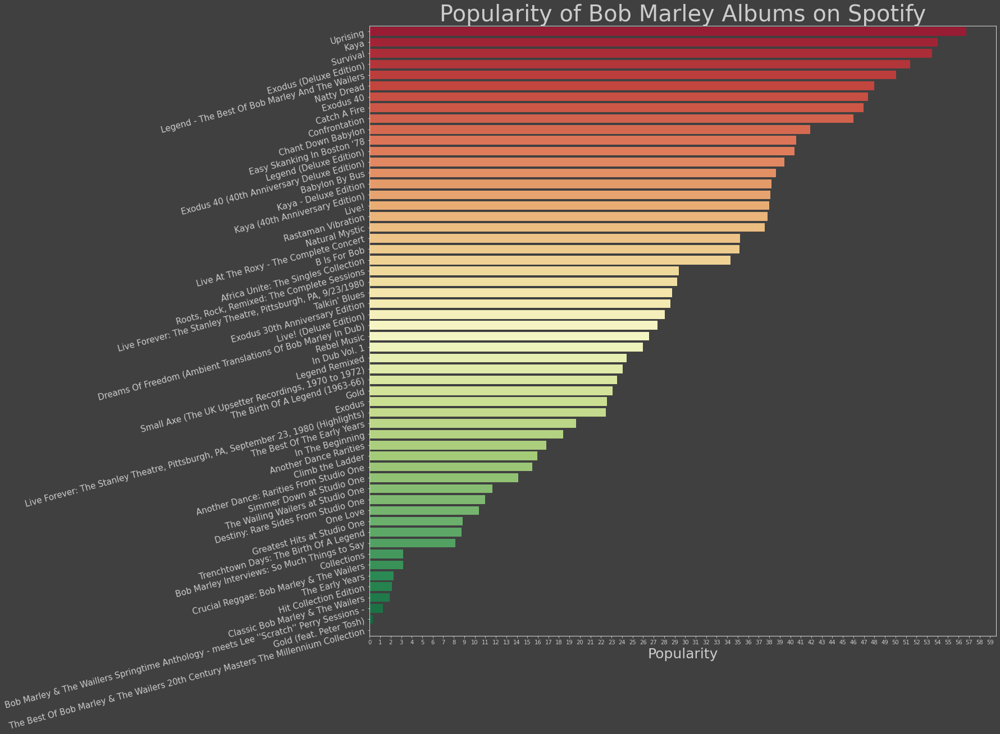

In [402]:
# Popularity of Albums 




plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey



# take average of songs on album

album_avgs_df = df.groupby(['album']).mean()

album_avgs_pop_df = album_avgs_df.sort_values(by='popularity', ascending=False)

plt.figure(figsize=(20, 20))

sns.barplot(y =album_avgs_pop_df.index, x ='popularity', 
            data = album_avgs_pop_df, orient='h', ci=None, palette="RdYlGn")

plt.title('Popularity of Bob Marley Albums on Spotify', fontsize=40)
plt.xlabel('Popularity', fontsize=25)
plt.ylabel('')
plt.yticks(fontsize=15, rotation=15)
plt.xticks(np.arange(0,60,1))
plt.show()

In [338]:
pd.set_option('display.max_rows', None)

album_avgs_pop_df

,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
album,,,,,,,,,,,
Uprising,6.500000,0.217595,0.847417,0.534083,0.002085,0.073600,-8.464000,0.081692,125.004000,0.865083,56.750000
Kaya,6.000000,0.092008,0.750000,0.502182,0.000027,0.092882,-8.857727,0.122745,129.521000,0.634364,54.000000
Survival,6.000000,0.158255,0.888636,0.523909,0.003788,0.080245,-8.661636,0.123182,127.530636,0.829182,53.454545
Exodus (Deluxe Edition),7.000000,0.180537,0.789160,0.499600,0.121384,0.293632,-10.615200,0.180824,120.246920,0.776320,51.400000
Legend - The Best Of Bob Marley And The Wailers,8.500000,0.186686,0.805375,0.536062,0.024973,0.135369,-9.386188,0.159531,109.025438,0.756625,50.062500
Natty Dread,5.500000,0.303700,0.783300,0.468100,0.003745,0.098940,-9.561500,0.175690,119.334800,0.768300,48.000000
Exodus 40,5.500000,0.181642,0.805200,0.449900,0.009436,0.130040,-10.653600,0.202430,121.764400,0.773600,47.400000
Catch A Fire,5.550000,0.248605,0.742400,0.565600,0.019205,0.104835,-7.920850,0.160430,130.618500,0.790050,46.950000
Confrontation,6.000000,0.183127,0.808364,0.443182,0.002674,0.086045,-9.942182,0.198955,132.881455,0.761364,46.000000


In [339]:
# Studio Albums

# duplicates keep first 539-569

# ADD BURNIN' (BY THE WAILERS)

studio_df = df.loc[df['album'].isin(['Uprising','Kaya','Survival','Natty Dread','Exodus','Catch a Fire','Confrontation','Rastaman Vibration'])].reset_index(drop=True).copy()

studio_df.drop(studio_df.index[57:88], inplace=True)

studio_df

,album,release_date,track_number,name,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,Confrontation,2017-06-02,1,Chant Down Babylon,0.250000,0.718,0.459,0.000000,0.0496,-9.134,0.1010,142.243,0.862,43
1,Confrontation,2017-06-02,2,Buffalo Soldier,0.142000,0.929,0.463,0.000005,0.0634,-8.651,0.3080,124.084,0.757,73
2,Confrontation,2015-02-03,3,Jump Nyabinghi,0.359000,0.820,0.618,0.000086,0.0677,-8.823,0.3940,142.859,0.868,43
3,Confrontation,2011-02-01,4,"Mix Up, Mix Up",0.150000,0.739,0.482,0.000220,0.1100,-9.356,0.0841,175.574,0.833,41
4,Confrontation,2011-01-01,5,Give Thanks & Praises,0.237000,0.912,0.315,0.000034,0.0642,-12.220,0.2120,117.461,0.735,41
5,Confrontation,2009-06-23,6,Blackman Redemption,0.421000,0.903,0.408,0.002480,0.0545,-9.425,0.1900,125.815,0.736,42
6,Confrontation,2007-08-08,7,Trench Town,0.081300,0.733,0.306,0.000000,0.1530,-11.435,0.3800,145.876,0.552,43
7,Confrontation,2007-01-01,8,Stiff Necked Fools,0.112000,0.669,0.268,0.000024,0.1250,-12.571,0.2610,143.362,0.738,41
8,Confrontation,2007,9,I Know,0.054600,0.635,0.703,0.000000,0.0790,-6.934,0.0402,89.566,0.745,39
9,Confrontation,2007,10,Rastaman Live Up,0.181000,0.904,0.330,0.025400,0.0471,-11.117,0.1240,130.688,0.700,61


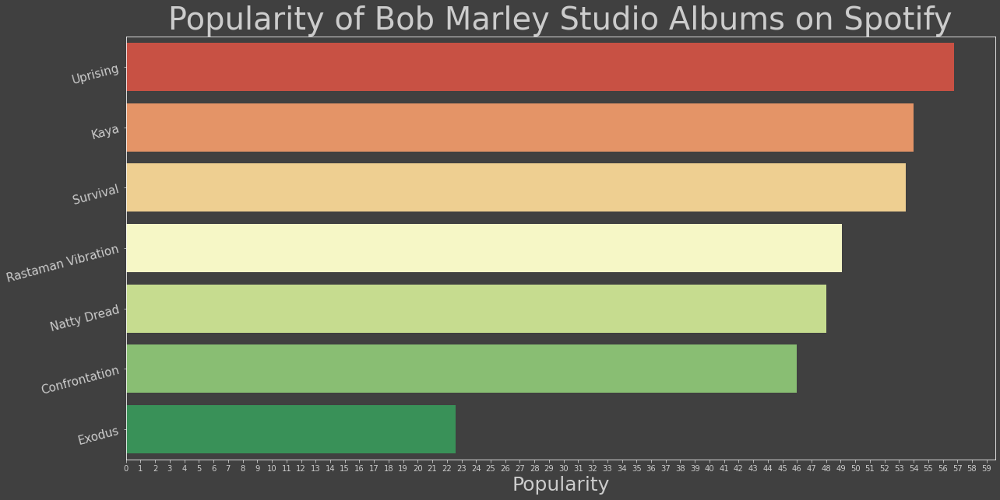

In [340]:
# Popularity of Albums 



plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey


# take average of songs on album

studio_df_pop = studio_df.groupby(['album']).mean()

studio_df_pop = studio_df_pop.sort_values(by='popularity', ascending=False)

plt.figure(figsize=(20, 10))

sns.barplot(y =studio_df_pop.index, x ='popularity', 
            data = studio_df_pop, orient='h', ci=None, palette="RdYlGn")

plt.title('Popularity of Bob Marley Studio Albums on Spotify', fontsize=40)
plt.xlabel('Popularity', fontsize=25)
plt.ylabel('')
plt.yticks(fontsize=15, rotation=15)
plt.xticks(np.arange(0,60,1))
plt.show()

In [341]:
uprising_df = studio_df[studio_df['album']== 'Uprising']
kaya_df = studio_df[studio_df['album']== 'Kaya']
survival_df = studio_df[studio_df['album']== 'Survival']
rasta_df = studio_df[studio_df['album'] == 'Rastaman Vibration']
natty_df = studio_df[studio_df['album']== 'Natty Dread']
con_df = studio_df[studio_df['album']== 'Confrontation']
exo_df = studio_df[studio_df['album']== 'Exodus']


up = uprising_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
kaya = kaya_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
surv = survival_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
rasta = rasta_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
natty = natty_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
con = con_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
exo = exo_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]




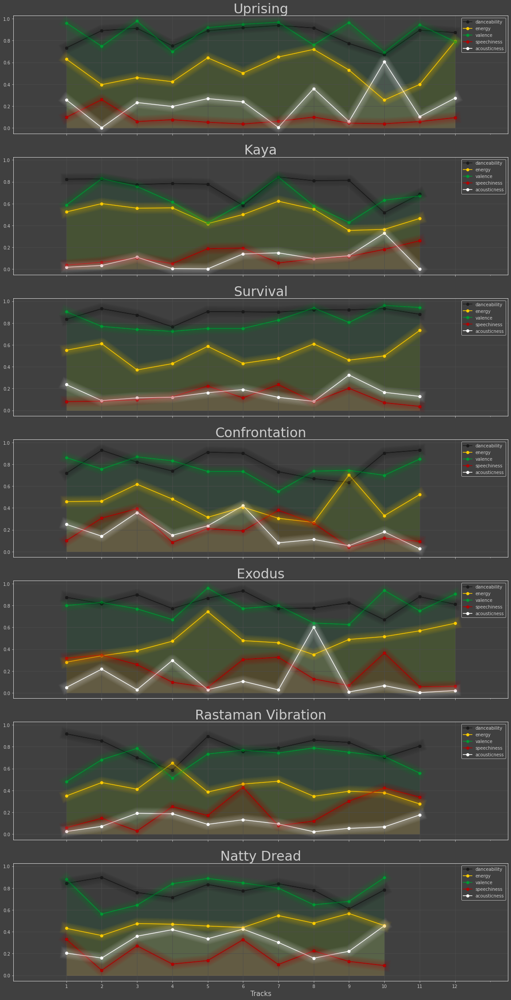

In [342]:

plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
colors = [  
           
    '#1a1a1a',  # black
     '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]

fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(ncols=1, nrows=7, sharey=True, sharex=True, figsize=(20,40))


up.reset_index(drop=True).plot(marker='o', color=colors,legend=True, ax=ax1)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    up.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax1,
            color=colors)

# Color the areas below the lines:
for column, color in zip(up.reset_index(drop=True), colors):
    ax1.fill_between(x=up.reset_index(drop=True).index,
                    y1=up.reset_index(drop=True)[column].values,
                    y2=[0] * len(up.reset_index(drop=True)),
                    color=color,
                    alpha=0.1)
    
ax1.grid(color='#4d4d4d')
ax1.set_xlim(-0.5, 11.5)  # to not have the markers cut off
ax1.set_ylim(-0.05)
ax1.set_xlabel('Tracks', fontsize=15)
ax1.set_xticks(np.arange(1, 12, 1))
ax1.set_xticklabels(np.arange(1, 13, 1))
ax1.set_title('Uprising', fontsize=30)




kaya.reset_index(drop=True).plot(marker='o', color=colors,legend=True, ax=ax2)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades

for n in range(1, n_shades+1):
    kaya.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax2,
            color=colors)

# Color the areas below the lines:
for column, color in zip(kaya, colors):
    ax2.fill_between(x=kaya.reset_index(drop=True).index,
                    y1=kaya[column].values,
                    y2=[0] * len(kaya),
                    color=color,
                    alpha=0.1)

ax2.grid(color='#4d4d4d')
ax2.set_xlim(-0.5, 11.5)   # to not have the markers cut off
ax2.set_ylim(-0.05)
ax2.set_xlabel('Tracks', fontsize=15)
ax2.set_xticks(np.arange(0, 12, 1))
ax2.set_xticklabels(np.arange(1, 13, 1))
ax2.set_title('Kaya', fontsize=30)




surv.reset_index(drop=True).plot(marker='o', color=colors, ax=ax3)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    surv.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax3,
            color=colors)

# Color the areas below the lines:
for column, color in zip(surv, colors):
    ax3.fill_between(x=surv.reset_index(drop=True).index,
                    y1=surv[column].values,
                    y2=[0] * len(surv),
                    color=color,
                    alpha=0.1)
    
ax3.grid(color='#4d4d4d')
ax3.set_xlim([ax3.get_xlim()[0] - 0.2, ax3.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax3.set_ylim(-0.05)
ax3.set_xlabel('Tracks', fontsize=15)
ax3.set_xticks(np.arange(0, 12, 1))
ax3.set_xticklabels(np.arange(1, 13, 1))
ax3.set_title('Survival', fontsize=30)





con.reset_index(drop=True).plot(marker='o', color=colors, ax=ax4)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    con.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax4,
            color=colors)

# Color the areas below the lines:
for column, color in zip(con, colors):
    ax4.fill_between(x=con.reset_index(drop=True).index,
                    y1=con[column].values,
                    y2=[0] * len(con),
                    color=color,
                    alpha=0.1)
    
ax4.grid(color='#4d4d4d')
ax4.set_xlim([ax4.get_xlim()[0] - 0.2, ax4.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax4.set_ylim(-0.05)
ax4.set_xlabel('Tracks', fontsize=15)
ax4.set_xticks(np.arange(0, 12, 1))
ax4.set_xticklabels(np.arange(1, 13, 1))
ax4.set_title('Confrontation', fontsize=30)




exo.reset_index(drop=True).plot(marker='o', color=colors, ax=ax5)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    exo.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax5,
            color=colors)

# Color the areas below the lines:
for column, color in zip(exo, colors):
    ax5.fill_between(x=exo.reset_index(drop=True).index,
                    y1=exo[column].values,
                    y2=[0] * len(exo),
                    color=color,
                    alpha=0.1)
    
ax5.grid(color='#4d4d4d')
ax5.set_xlim([ax5.get_xlim()[0] - 0.2, ax5.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax5.set_ylim(-0.05)
ax5.set_xlabel('Tracks', fontsize=15)
ax5.set_xticks(np.arange(0, 12, 1))
ax5.set_xticklabels(np.arange(1, 13, 1))
ax5.set_title('Exodus', fontsize=30)




rasta.reset_index(drop=True).plot(marker='o', color=colors, ax=ax6)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    rasta.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax6,
            color=colors)

# Color the areas below the lines:
for column, color in zip(rasta, colors):
    ax6.fill_between(x=rasta.reset_index(drop=True).index,
                    y1=rasta[column].values,
                    y2=[0] * len(rasta),
                    color=color,
                    alpha=0.1)
    
ax6.grid(color='#4d4d4d')
ax6.set_xlim([ax6.get_xlim()[0] - 0.2, ax6.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax6.set_ylim(-0.05)
ax6.set_xlabel('Tracks', fontsize=15)
ax6.set_xticks(np.arange(0, 12, 1))
ax6.set_xticklabels(np.arange(1, 13, 1))
ax6.set_title('Rastaman Vibration', fontsize=30)



natty.reset_index(drop=True).plot(marker='o', color=colors, ax=ax7)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    natty.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax7,
            color=colors)

# Color the areas below the lines:
for column, color in zip(natty, colors):
    ax7.fill_between(x=natty.reset_index(drop=True).index,
                    y1=natty[column].values,
                    y2=[0] * len(natty),
                    color=color,
                    alpha=0.1)
    
ax7.grid(color='#4d4d4d')
ax7.set_xlim([ax7.get_xlim()[0] - 0.2, ax7.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax7.set_ylim(-0.05)
ax7.set_xlabel('Tracks', fontsize=15)
ax7.set_xticks(np.arange(0, 12, 1))
ax7.set_xticklabels(np.arange(1, 13, 1))
ax7.set_title('Natty Dread', fontsize=30)


plt.show()

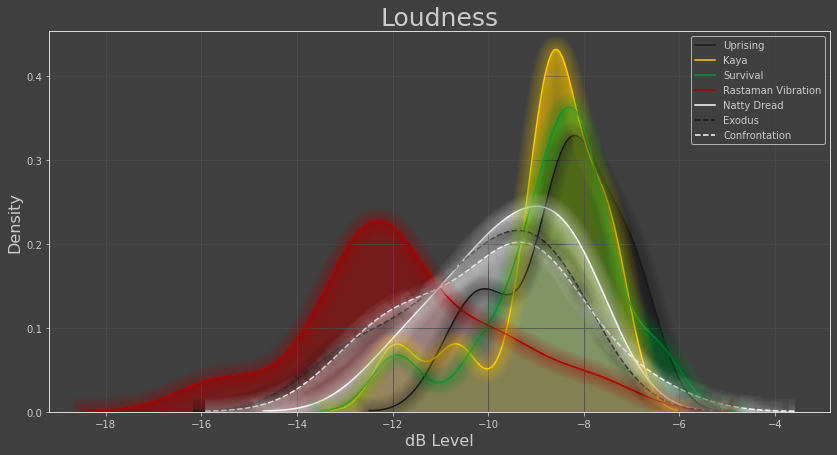

In [343]:

plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
    
colors = [  
    '#1a1a1a',  # black
    '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]
    

fig = plt.figure(figsize=(14,7))

sns.kdeplot(uprising_df['loudness'], label='Uprising', shade = True, color = colors[0])
sns.kdeplot(kaya_df['loudness'], label='Kaya', shade = True, color = colors[1] )
sns.kdeplot(survival_df['loudness'], label='Survival', shade = True, color = colors[2] )
sns.kdeplot(rasta_df['loudness'], label='Rastaman Vibration', shade = True, color = colors[3] )
sns.kdeplot(natty_df['loudness'], label='Natty Dread', shade = True, color = colors[4] )
sns.kdeplot(exo_df['loudness'], label='Exodus', shade = True, color = colors[0], linestyle='--' )
sns.kdeplot(con_df['loudness'], label='Confrontation', shade = True, color = colors[4], linestyle='--' )



# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.4 / n_shades
for n in range(1, n_shades+1):
    sns.kdeplot(uprising_df['loudness'], label='Uprising',linewidth=2+(diff_linewidth*n),
                alpha=alpha_value, shade = True, color = colors[0], legend=False )
    sns.kdeplot(kaya_df['loudness'], label='Kaya', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[1] , legend=False )
    sns.kdeplot(survival_df['loudness'], label='Survival', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[2], legend=False  )
    sns.kdeplot(rasta_df['loudness'], label='Rastaman Vibration',linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[3], legend=False  )
    sns.kdeplot(natty_df['loudness'], label='Natty Dread', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[4], legend=False  )
    sns.kdeplot(exo_df['loudness'], label='Exodus', shade = True, linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, legend=False , color = colors[0], linestyle='--' )
    sns.kdeplot(con_df['loudness'], label='Confrontation', shade = True, linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, legend=False , color = colors[4], linestyle='--' )

plt.grid(color='#4d4d4d')    
plt.title('Loudness', fontsize = 25)
plt.xlabel('dB Level', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.show()

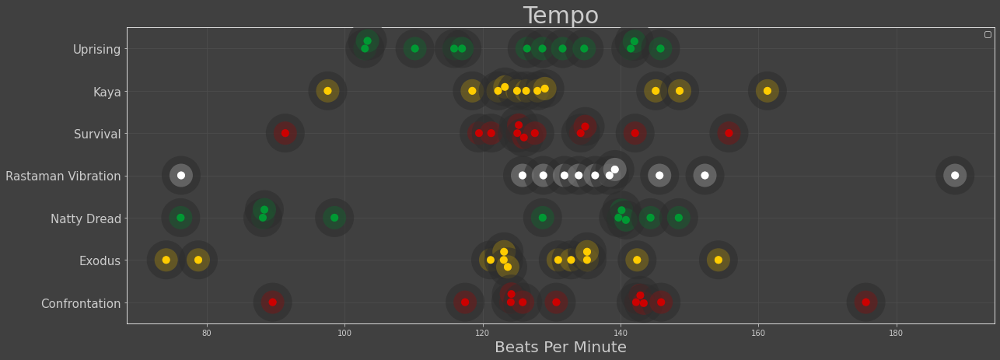

In [344]:

plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
    
colors = [  
           

    '#009933',  # green    
    '#ffcc00',  # yellow 
    '#cc0000',  # red
        '#ffffff',  # white 
]


plt.figure(figsize=(20,7))

data = uprising_df.append(kaya_df, ignore_index=True).append(survival_df, ignore_index=True).append(rasta_df, ignore_index=True).append(natty_df, ignore_index=True).append(exo_df, ignore_index=True).append(con_df, ignore_index=True)


sns.swarmplot(x='tempo', y='album', data=data, hue='album', palette =colors, size=30, 
              linewidth = -20, alpha=0.6)
    
sns.swarmplot(x='tempo', y='album', data=data, hue='album', palette =colors, size=10)

plt.grid(color='#4d4d4d')  
plt.legend('')
plt.xlabel('Beats Per Minute', fontsize=20)
plt.title('Tempo', fontsize=30)
plt.ylabel('')
plt.yticks(fontsize=15)

plt.show()

In [345]:
# Compilation Albums

# Only ISLAND/TUFF GONG and TROJAN

comp_df = df.loc[df['album'].isin(['Rebel Music','Legend - The Best Of Bob Marley And The Wailers', 'Rasta Revolution', 'Natural Mystic', 'One Love', 'Gold', 'Africa Unite: The Singles Collection'])]
                 
comp_df

,album,release_date,track_number,name,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
202,Africa Unite: The Singles Collection,2017-06-02,1,Soul Rebels,0.00113,0.821,0.3720,0.000188,0.0962,-7.653,0.1020,93.086,0.517,43
203,Africa Unite: The Singles Collection,2017-06-02,2,Lively Up Yourself,0.62100,0.880,0.6640,0.323000,0.0901,-8.365,0.0693,128.930,0.966,46
204,Africa Unite: The Singles Collection,2015-02-03,3,Trench Town Rock,0.19200,0.771,0.6220,0.000000,0.4790,-6.950,0.3460,74.798,0.606,36
205,Africa Unite: The Singles Collection,2011-02-01,4,Concrete Jungle - Trailer,0.07290,0.762,0.6300,0.000000,0.2250,-6.951,0.0469,130.045,0.812,33
206,Africa Unite: The Singles Collection,2011-01-01,5,I Shot The Sheriff - Edited Version,0.41200,0.788,0.6530,0.000007,0.0595,-8.367,0.2030,96.582,0.696,40
207,Africa Unite: The Singles Collection,2009-06-23,6,"Get Up, Stand Up",0.24900,0.770,0.5740,0.000000,0.0687,-7.232,0.3490,78.165,0.819,32
208,Africa Unite: The Singles Collection,2007-08-08,7,"No Woman, No Cry - Live At The Lyceum, London/...",0.23900,0.649,0.6470,0.038200,0.9650,-9.660,0.0721,78.318,0.662,32
209,Africa Unite: The Singles Collection,2007-01-01,8,"Roots, Rock, Reggae",0.11100,0.858,0.5230,0.000026,0.0608,-8.627,0.1210,139.248,0.700,32
210,Africa Unite: The Singles Collection,2007,9,Exodus,0.04750,0.845,0.7910,0.000711,0.1120,-7.473,0.0497,133.143,0.975,34
211,Africa Unite: The Singles Collection,2007,10,Waiting In Vain,0.02830,0.762,0.4770,0.000023,0.0974,-10.825,0.3250,78.812,0.789,31


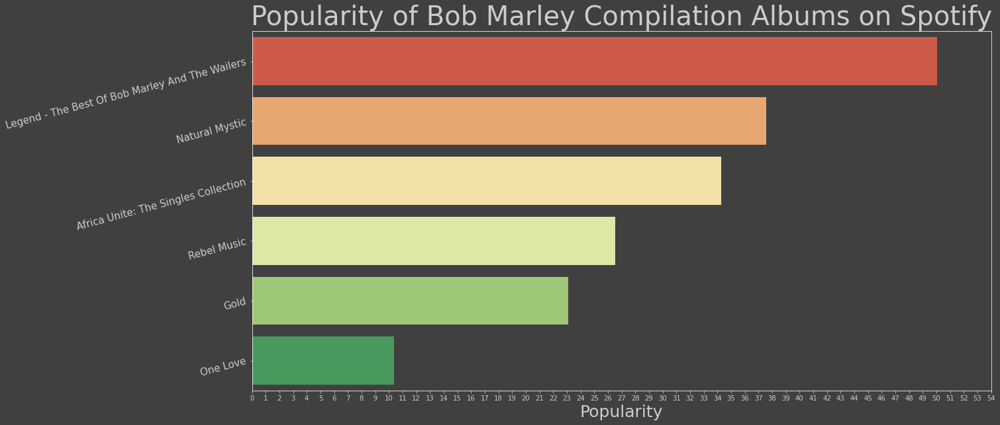

In [346]:
# Popularity of Albums 



plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey


# take average of songs on album

comp_df_pop = comp_df.groupby(['album']).mean()

comp_df_pop = comp_df_pop.sort_values(by='popularity', ascending=False)

plt.figure(figsize=(20, 10))

sns.barplot(y =comp_df_pop.index, x ='popularity', 
            data = comp_df_pop, orient='h', ci=None, palette="RdYlGn")

plt.title('Popularity of Bob Marley Compilation Albums on Spotify', fontsize=40)
plt.xlabel('Popularity', fontsize=25)
plt.ylabel('')
plt.yticks(fontsize=15, rotation=15)
plt.xticks(np.arange(0,55,1))
plt.show()

In [347]:
legend_df = comp_df[comp_df['album']== 'Legend - The Best Of Bob Marley And The Wailers']
natural_df = comp_df[comp_df['album']== 'Natural Mystic']
africa_df = comp_df[comp_df['album']== 'Africa Unite: The Singles Collection']
rebel_df = comp_df[comp_df['album'] == 'Rebel Music']
gold_df = comp_df[comp_df['album']== 'Gold']
one_df = comp_df[comp_df['album']== 'One Love']



legend = legend_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
natural = natural_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
africa = africa_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
rebel = rebel_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
gold = gold_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
one = one_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]



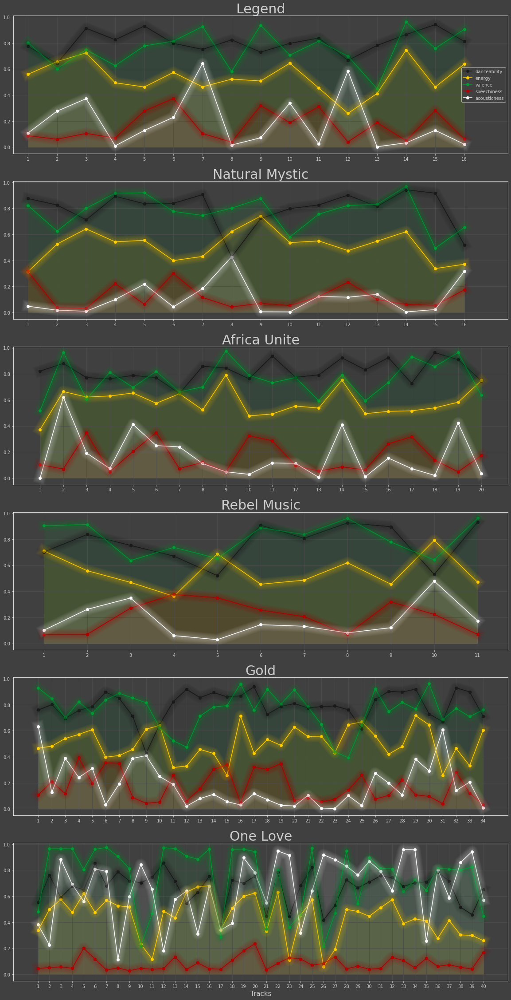

In [348]:

plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
colors = [  
           
    '#1a1a1a',  # black
     '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]

fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(ncols=1, nrows=6, sharey=True, sharex=False, figsize=(20,40))


legend.reset_index(drop=True).plot(marker='o', color=colors,legend=True, ax=ax1)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    legend.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax1,
            color=colors)

# Color the areas below the lines:
for column, color in zip(legend.reset_index(drop=True), colors):
    ax1.fill_between(x=legend.reset_index(drop=True).index,
                    y1=legend.reset_index(drop=True)[column].values,
                    y2=[0] * len(legend.reset_index(drop=True)),
                    color=color,
                    alpha=0.1)
    
ax1.grid(color='#4d4d4d')
ax1.set_xlim(-0.5, 16.5)  # to not have the markers cut off
ax1.set_ylim(-0.05)
ax1.set_xticks(np.arange(0, 16, 1))
ax1.set_xticklabels(np.arange(1, 17, 1))
ax1.set_title('Legend', fontsize=30)




natural.reset_index(drop=True).plot(marker='o', color=colors,legend=False, ax=ax2)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades

for n in range(1, n_shades+1):
    natural.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax2,
            color=colors)

# Color the areas below the lines:
for column, color in zip(natural, colors):
    ax2.fill_between(x=natural.reset_index(drop=True).index,
                    y1=natural[column].values,
                    y2=[0] * len(natural),
                    color=color,
                    alpha=0.1)

ax2.grid(color='#4d4d4d')
ax2.set_xlim(-0.5, 16.5)   # to not have the markers cut off
ax2.set_ylim(-0.05)
ax2.set_xticks(np.arange(0, 16, 1))
ax2.set_xticklabels(np.arange(1, 17, 1))
ax2.set_title('Natural Mystic', fontsize=30)




africa.reset_index(drop=True).plot(marker='o', color=colors,legend=False, ax=ax3)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    africa.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax3,
            color=colors)

# Color the areas below the lines:
for column, color in zip(africa, colors):
    ax3.fill_between(x=africa.reset_index(drop=True).index,
                    y1=africa[column].values,
                    y2=[0] * len(africa),
                    color=color,
                    alpha=0.1)
    
ax3.grid(color='#4d4d4d')
ax3.set_xlim([ax3.get_xlim()[0] - 0.2, ax3.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax3.set_ylim(-0.05)
ax3.set_xticks(np.arange(0, 20, 1))
ax3.set_xticklabels(np.arange(1, 21, 1))
ax3.set_title('Africa Unite', fontsize=30)





rebel.reset_index(drop=True).plot(marker='o', color=colors,legend=False, ax=ax4)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    rebel.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax4,
            color=colors)

# Color the areas below the lines:
for column, color in zip(rebel, colors):
    ax4.fill_between(x=rebel.reset_index(drop=True).index,
                    y1=rebel[column].values,
                    y2=[0] * len(rebel),
                    color=color,
                    alpha=0.1)
    
ax4.grid(color='#4d4d4d')
ax4.set_xlim([ax4.get_xlim()[0] - 0.2, ax4.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax4.set_ylim(-0.05)
ax4.set_xticks(np.arange(0, 11, 1))
ax4.set_xticklabels(np.arange(1, 12, 1))
ax4.set_title('Rebel Music', fontsize=30)




gold.reset_index(drop=True).plot(marker='o', color=colors, legend=False,ax=ax5)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    gold.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax5,
            color=colors)

# Color the areas below the lines:
for column, color in zip(gold, colors):
    ax5.fill_between(x=gold.reset_index(drop=True).index,
                    y1=gold[column].values,
                    y2=[0] * len(gold),
                    color=color,
                    alpha=0.1)
    
ax5.grid(color='#4d4d4d')
ax5.set_xlim([ax5.get_xlim()[0] - 0.2, ax5.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax5.set_ylim(-0.05)
ax5.set_xticks(np.arange(0, 34, 1))
ax5.set_xticklabels(np.arange(1, 35, 1))
ax5.set_title('Gold', fontsize=30)




one.reset_index(drop=True).plot(marker='o', color=colors, legend=False,ax=ax6)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    one.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax6,
            color=colors)

# Color the areas below the lines:
for column, color in zip(one, colors):
    ax6.fill_between(x=one.reset_index(drop=True).index,
                    y1=one[column].values,
                    y2=[0] * len(one),
                    color=color,
                    alpha=0.1)
    
ax6.grid(color='#4d4d4d')
ax6.set_xlim([ax6.get_xlim()[0] - 0.2, ax6.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax6.set_ylim(-0.05)
ax6.set_xlabel('Tracks', fontsize=15)
ax6.set_xticks(np.arange(0, 40, 1))
ax6.set_xticklabels(np.arange(1, 41, 1))
ax6.set_title('One Love', fontsize=30)



plt.show()

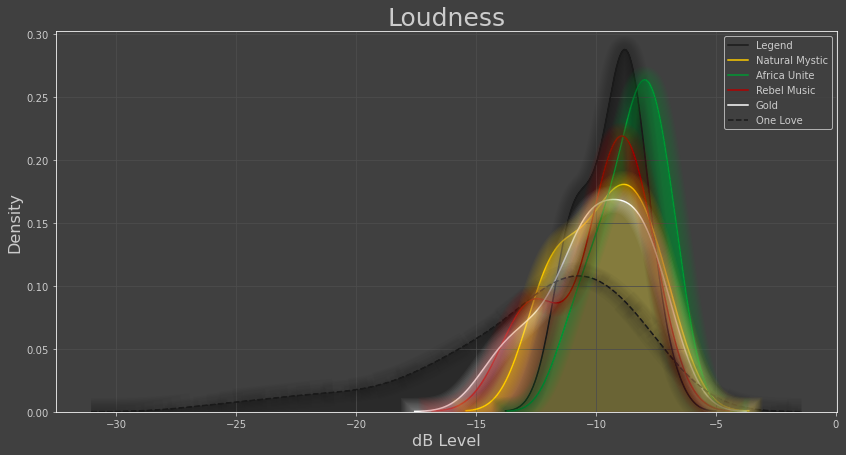

In [349]:

plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
    
colors = [  
    '#1a1a1a',  # black
    '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]
    

fig = plt.figure(figsize=(14,7))

sns.kdeplot(legend_df['loudness'], label='Legend', shade = True, color = colors[0])
sns.kdeplot(natural_df['loudness'], label='Natural Mystic', shade = True, color = colors[1] )
sns.kdeplot(africa_df['loudness'], label='Africa Unite', shade = True, color = colors[2] )
sns.kdeplot(rebel_df['loudness'], label='Rebel Music', shade = True, color = colors[3] )
sns.kdeplot(gold_df['loudness'], label='Gold', shade = True, color = colors[4] )
sns.kdeplot(one_df['loudness'], label='One Love', shade = True, color = colors[0], linestyle='--' )




# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.4 / n_shades
for n in range(1, n_shades+1):
    sns.kdeplot(legend_df['loudness'], label='Legend',linewidth=2+(diff_linewidth*n),
                alpha=alpha_value, shade = True, color = colors[0], legend=False )
    sns.kdeplot(natural_df['loudness'], label='Natural Mystic', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[1] , legend=False )
    sns.kdeplot(africa_df['loudness'], label='Africa Unite', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[2], legend=False  )
    sns.kdeplot(rebel_df['loudness'], label='Rebel Music',linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[3], legend=False  )
    sns.kdeplot(gold_df['loudness'], label='Gold', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[4], legend=False  )
    sns.kdeplot(one_df['loudness'], label='One Love', shade = True, linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, legend=False , color = colors[0], linestyle='--' )


plt.grid(color='#4d4d4d')    
plt.title('Loudness', fontsize = 25)
plt.xlabel('dB Level', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.show()

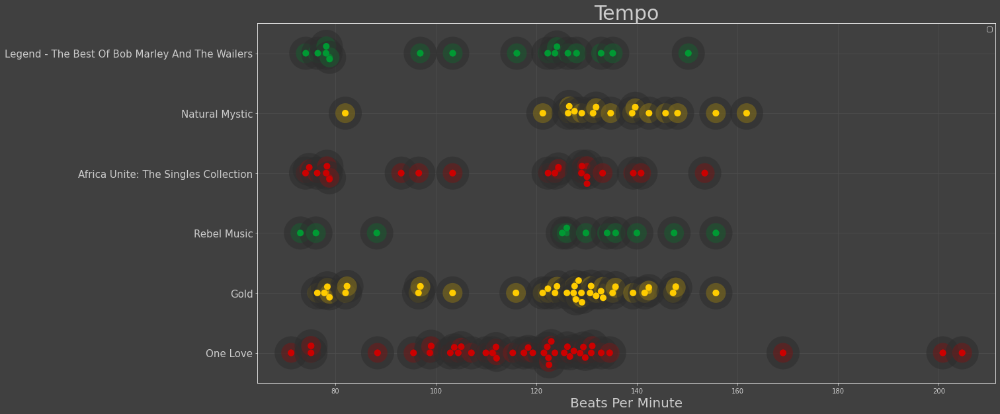

In [350]:

plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
    
colors = [  
           

    '#009933',  # green    
    '#ffcc00',  # yellow 
    '#cc0000',  # red

]


plt.figure(figsize=(20,10))

data = legend_df.append(natural_df, ignore_index=True).append(africa_df, ignore_index=True).append(rebel_df, ignore_index=True).append(gold_df, ignore_index=True).append(one_df, ignore_index=True)


sns.swarmplot(x='tempo', y='album', data=data, hue='album', palette =colors, size=30, 
              linewidth = -20, alpha=0.6)
    
sns.swarmplot(x='tempo', y='album', data=data, hue='album', palette =colors, size=10)

plt.grid(color='#4d4d4d')  
plt.legend('')
plt.xlabel('Beats Per Minute', fontsize=20)
plt.title('Tempo', fontsize=30)
plt.ylabel('')
plt.yticks(fontsize=15)

plt.show()

In [351]:
# Live Albums

live_df = df.loc[df['album'].isin(['Live!', 'Babylon By Bus', "Talkin' Blues", "Easy Skanking In Boston '78", 'Live At The Roxy - The Complete Concert', 'Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980'])]

live_df

,album,release_date,track_number,name,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
38,Easy Skanking In Boston '78,2017-06-02,1,"Slave Driver - Live At Music Hall, Boston / 1978",0.236000,0.574,0.6680,0.000110,0.6980,-6.997,0.1110,138.634,0.750,40
39,Easy Skanking In Boston '78,2017-06-02,2,"Burnin' & Lootin' - Live At Music Hall, Boston...",0.347000,0.613,0.7860,0.000077,0.2330,-6.434,0.0688,138.618,0.892,40
40,Easy Skanking In Boston '78,2015-02-03,3,"Them Belly Full - Live At Music Hall, Boston /...",0.421000,0.675,0.8790,0.000002,0.8270,-5.879,0.2990,143.906,0.877,39
41,Easy Skanking In Boston '78,2011-02-01,4,"The Heathen - Live At Music Hall, Boston / 1978",0.050200,0.717,0.6040,0.004220,0.9490,-9.461,0.0629,138.023,0.619,38
42,Easy Skanking In Boston '78,2011-01-01,5,"Rebel Music - Live At Music Hall, Boston / 1978",0.019100,0.579,0.6500,0.000151,0.7340,-8.728,0.0841,149.160,0.865,38
43,Easy Skanking In Boston '78,2009-06-23,6,"I Shot The Sheriff - Live At Music Hall, Bosto...",0.023700,0.592,0.8060,0.000000,0.8080,-7.427,0.0752,77.047,0.792,41
44,Easy Skanking In Boston '78,2007-08-08,7,"Easy Skanking - Live At Music Hall, Boston / 1978",0.032100,0.722,0.7650,0.000002,0.7180,-8.561,0.0875,129.372,0.828,39
45,Easy Skanking In Boston '78,2007-01-01,8,"No Woman No Cry - Live At Music Hall, Boston /...",0.241000,0.598,0.6590,0.000002,0.9960,-9.066,0.0738,73.709,0.686,41
46,Easy Skanking In Boston '78,2007,9,"Lively Up Yourself - Live At Music Hall, Bosto...",0.108000,0.598,0.7720,0.000028,0.2690,-8.444,0.0646,76.276,0.875,59
47,Easy Skanking In Boston '78,2007,10,"Jamming - Live At Music Hall, Boston / 1978",0.019800,0.512,0.8550,0.001900,0.8930,-7.558,0.1000,139.239,0.520,39


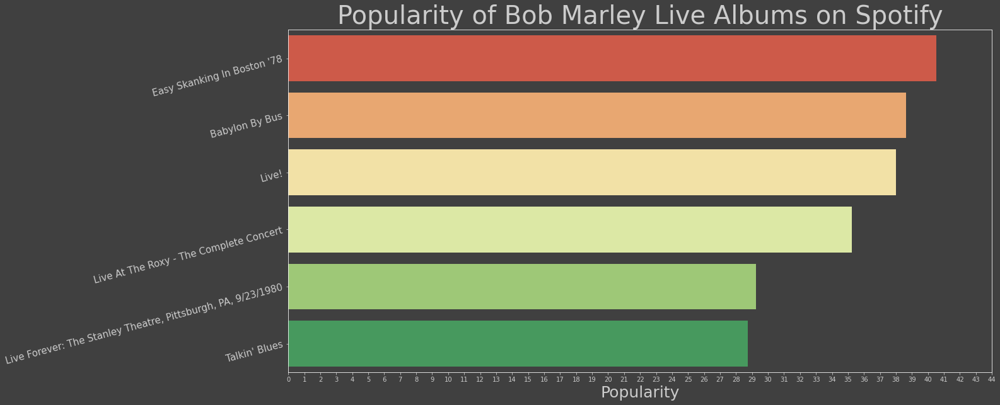

In [352]:
# Popularity of Albums 



plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey


# take average of songs on album

live_df_pop = live_df.groupby(['album']).mean()

live_df_pop = live_df_pop.sort_values(by='popularity', ascending=False)

plt.figure(figsize=(20, 10))

sns.barplot(y =live_df_pop.index, x ='popularity', 
            data = live_df_pop, orient='h', ci=None, palette="RdYlGn")

plt.title('Popularity of Bob Marley Live Albums on Spotify', fontsize=40)
plt.xlabel('Popularity', fontsize=25)
plt.ylabel('')
plt.yticks(fontsize=15, rotation=15)
plt.xticks(np.arange(0,45,1))
plt.show()

In [353]:
easy_df = live_df[live_df['album']== "Easy Skanking In Boston '78"]
babylon_df = live_df[live_df['album']== 'Babylon By Bus']
live_live_df = live_df[live_df['album']== 'Live!']
roxy_df = live_df[live_df['album'] == 'Live At The Roxy - The Complete Concert']
forever_df = live_df[live_df['album']== 'Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980']
blues_df = live_df[live_df['album']== "Talkin' Blues"]



easy = easy_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
babylon = babylon_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
live = live_live_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
roxy = roxy_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
forever = forever_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]
blues = blues_df[['danceability', 'energy', 'valence', 'speechiness', 'acousticness']]




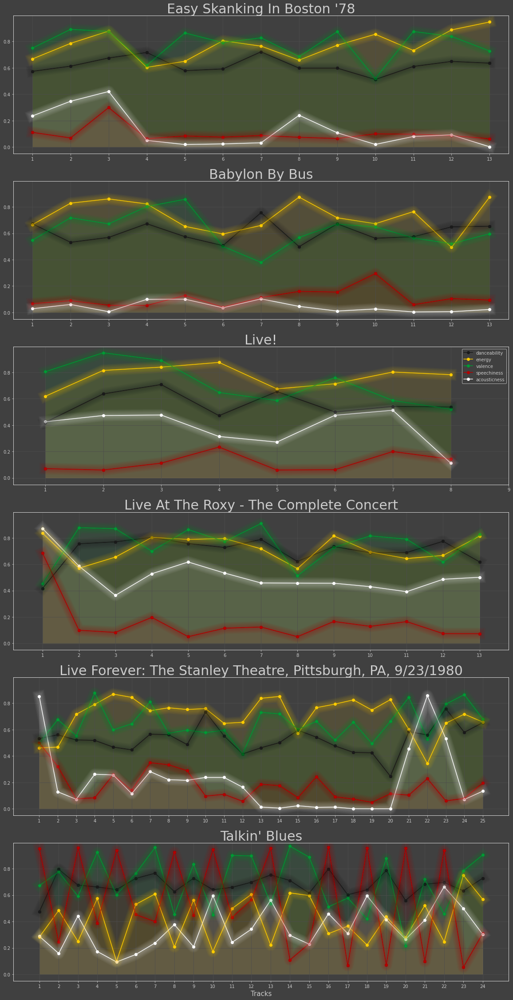

In [354]:
plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
colors = [  
           
    '#1a1a1a',  # black
     '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]

fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(ncols=1, nrows=6, sharey=True, sharex=False, figsize=(20,40))


easy.reset_index(drop=True).plot(marker='o', color=colors,legend=False, ax=ax1)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    easy.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax1,
            color=colors)

# Color the areas below the lines:
for column, color in zip(easy.reset_index(drop=True), colors):
    ax1.fill_between(x=easy.reset_index(drop=True).index,
                    y1=easy.reset_index(drop=True)[column].values,
                    y2=[0] * len(easy.reset_index(drop=True)),
                    color=color,
                    alpha=0.1)
    
ax1.grid(color='#4d4d4d')
ax1.set_xlim(-0.5, 12.5)  # to not have the markers cut off
ax1.set_ylim(-0.05)
ax1.set_xticks(np.arange(0, 13, 1))
ax1.set_xticklabels(np.arange(1, 14, 1))
ax1.set_title("Easy Skanking In Boston '78", fontsize=30)




babylon.reset_index(drop=True).plot(marker='o', color=colors,legend=False, ax=ax2)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades

for n in range(1, n_shades+1):
    babylon.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax2,
            color=colors)

# Color the areas below the lines:
for column, color in zip(babylon, colors):
    ax2.fill_between(x=babylon.reset_index(drop=True).index,
                    y1=babylon[column].values,
                    y2=[0] * len(babylon),
                    color=color,
                    alpha=0.1)

ax2.grid(color='#4d4d4d')
ax2.set_xlim(-0.5, 12.5)   # to not have the markers cut off
ax2.set_ylim(-0.05)
ax2.set_xticks(np.arange(0, 13, 1))
ax2.set_xticklabels(np.arange(1, 14, 1))
ax2.set_title('Babylon By Bus', fontsize=30)




live.reset_index(drop=True).plot(marker='o', color=colors, ax=ax3)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    live.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax3,
            color=colors)

# Color the areas below the lines:
for column, color in zip(live, colors):
    ax3.fill_between(x=live.reset_index(drop=True).index,
                    y1=live[column].values,
                    y2=[0] * len(live),
                    color=color,
                    alpha=0.1)
    
ax3.grid(color='#4d4d4d')
ax3.set_xlim([ax3.get_xlim()[0] - 0.2, ax3.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax3.set_ylim(-0.05)
ax3.set_xticks(np.arange(0, 9, 1))
ax3.set_xticklabels(np.arange(1, 10, 1))
ax3.set_title('Live!', fontsize=30)





roxy.reset_index(drop=True).plot(marker='o', color=colors, ax=ax4, legend=False)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    roxy.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax4,
            color=colors)

# Color the areas below the lines:
for column, color in zip(roxy, colors):
    ax4.fill_between(x=roxy.reset_index(drop=True).index,
                    y1=roxy[column].values,
                    y2=[0] * len(roxy),
                    color=color,
                    alpha=0.1)
    
ax4.grid(color='#4d4d4d')
ax4.set_xlim([ax4.get_xlim()[0] - 0.2, ax4.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax4.set_ylim(-0.05)
ax4.set_xticks(np.arange(0, 13, 1))
ax4.set_xticklabels(np.arange(1, 14, 1))
ax4.set_title('Live At The Roxy - The Complete Concert', fontsize=30)




forever.reset_index(drop=True).plot(marker='o', color=colors, ax=ax5, legend=False)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    forever.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax5,
            color=colors)

# Color the areas below the lines:
for column, color in zip(forever, colors):
    ax5.fill_between(x=forever.reset_index(drop=True).index,
                    y1=forever[column].values,
                    y2=[0] * len(forever),
                    color=color,
                    alpha=0.1)
    
ax5.grid(color='#4d4d4d')
ax5.set_xlim([ax5.get_xlim()[0] - 0.2, ax5.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax5.set_ylim(-0.05)
ax5.set_xticks(np.arange(0, 25, 1))
ax5.set_xticklabels(np.arange(1, 26, 1))
ax5.set_title('Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980', fontsize=30)




blues.reset_index(drop=True).plot(marker='o', color=colors, ax=ax6, legend=False)

# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.3 / n_shades
for n in range(1, n_shades+1):
    blues.reset_index(drop=True).plot(marker='o',
            linewidth=2+(diff_linewidth*n),
            alpha=alpha_value,
            legend=False,
            ax=ax6,
            color=colors)

# Color the areas below the lines:
for column, color in zip(blues, colors):
    ax6.fill_between(x=blues.reset_index(drop=True).index,
                    y1=blues[column].values,
                    y2=[0] * len(blues),
                    color=color,
                    alpha=0.1)
    
ax6.grid(color='#4d4d4d')
ax6.set_xlim([ax6.get_xlim()[0] - 0.2, ax6.get_xlim()[1] + 0.2])  # to not have the markers cut off
ax6.set_ylim(-0.05)
ax6.set_xlabel('Tracks', fontsize=15)
ax6.set_xticks(np.arange(0, 24, 1))
ax6.set_xticklabels(np.arange(1, 25, 1))
ax6.set_title("Talkin' Blues", fontsize=30)



plt.show()

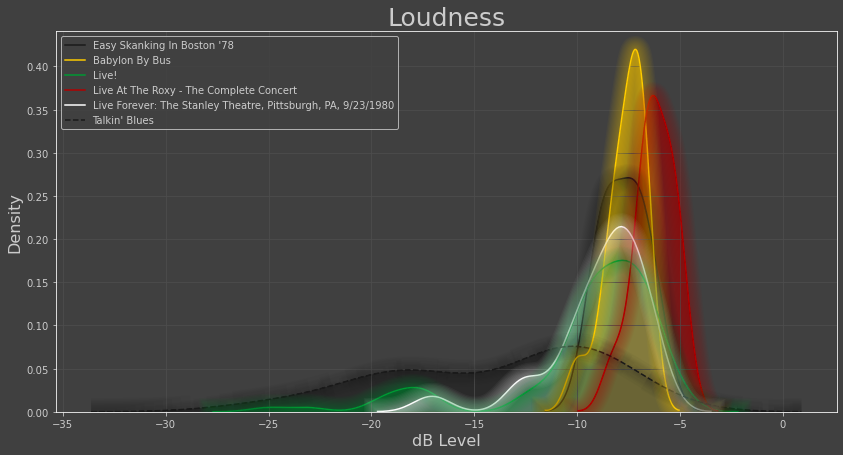

In [355]:
plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
    
colors = [  
    '#1a1a1a',  # black
    '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]
    

fig = plt.figure(figsize=(14,7))

sns.kdeplot(easy_df['loudness'], label="Easy Skanking In Boston '78", shade = True, color = colors[0])
sns.kdeplot(babylon_df['loudness'], label='Babylon By Bus', shade = True, color = colors[1] )
sns.kdeplot(live_df['loudness'], label='Live!', shade = True, color = colors[2] )
sns.kdeplot(roxy_df['loudness'], label='Live At The Roxy - The Complete Concert', shade = True, color = colors[3] )
sns.kdeplot(forever_df['loudness'], label='Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980', shade = True, color = colors[4] )
sns.kdeplot(blues_df['loudness'], label="Talkin' Blues", shade = True, color = colors[0], linestyle='--' )




# Redraw the data with low alpha and slighty increased linewidth:
n_shades = 10
diff_linewidth = 2.5
alpha_value = 0.4 / n_shades
for n in range(1, n_shades+1):
    sns.kdeplot(easy_df['loudness'], label="Easy Skanking In Boston '78",linewidth=2+(diff_linewidth*n),
                alpha=alpha_value, shade = True, color = colors[0], legend=False )
    sns.kdeplot(babylon_df['loudness'], label='Babylon By Bus', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[1] , legend=False )
    sns.kdeplot(live_df['loudness'], label='Live!', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[2], legend=False  )
    sns.kdeplot(roxy_df['loudness'], label='Live At The Roxy - The Complete Concert',linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[3], legend=False  )
    sns.kdeplot(forever_df['loudness'], label='Live Forever: The Stanley Theatre, Pittsburgh, PA, 9/23/1980', linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, shade = True, color = colors[4], legend=False  )
    sns.kdeplot(blues_df['loudness'], label="Talkin' Blues", shade = True, linewidth=2+(diff_linewidth*n), 
                alpha=alpha_value, legend=False , color = colors[0], linestyle='--' )


plt.grid(color='#4d4d4d')    
plt.title('Loudness', fontsize = 25)
plt.xlabel('dB Level', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.show()

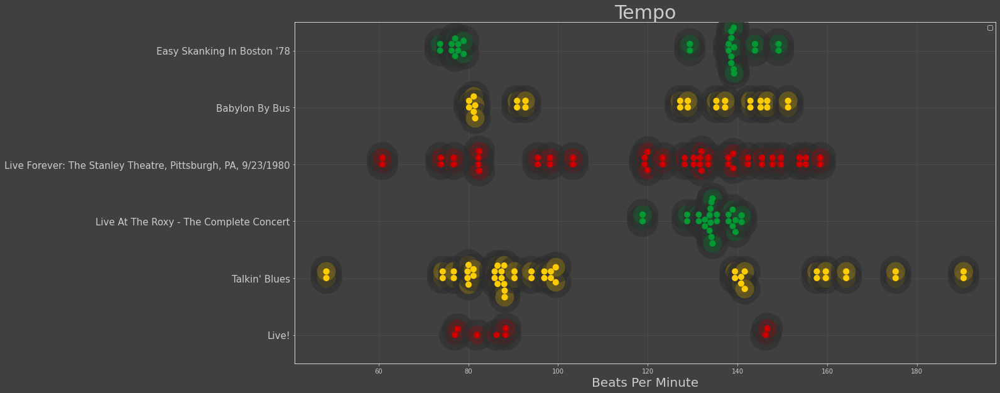

In [356]:
plt.style.use("dark_background")

for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '#cccccc'  # very dark grey

for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#404040'  # light grey
    
    
colors = [  
           

    '#009933',  # green    
    '#ffcc00',  # yellow 
    '#cc0000',  # red

]


plt.figure(figsize=(20,10))

data = easy_df.append(babylon_df, ignore_index=True).append(live_df, ignore_index=True).append(roxy_df, ignore_index=True).append(forever_df, ignore_index=True).append(blues_df, ignore_index=True)


sns.swarmplot(x='tempo', y='album', data=data, hue='album', palette =colors, size=30, 
              linewidth = -20, alpha=0.6)
    
sns.swarmplot(x='tempo', y='album', data=data, hue='album', palette =colors, size=10)

plt.grid(color='#4d4d4d')  
plt.legend('')
plt.xlabel('Beats Per Minute', fontsize=20)
plt.title('Tempo', fontsize=30)
plt.ylabel('')
plt.yticks(fontsize=15)

plt.show()

In [366]:
version_df = df.loc[df['album'].isin(['Exodus (Deluxe Edition)', 'Exodus 40', 'Legend (Deluxe Edition)', 'Legend - The Best Of Bob Marley And The Wailers', 'Exodus 40 (40th Anniversary Deluxe Edition)', 'Exodus', 'Kaya - Deluxe Edition', 'Kaya', 'Kaya (40th Anniversary Edition)', 'Live! (Deluxe Edition)', 'Live!', 'Exodus 30th Anniversary Edition', 'Rastaman Vibration'])]

version_df.iloc[159:190]['album'] = 'Rastaman Vibration (Deluxe Edition)'


version_df

/Users/sambrady/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,album,release_date,track_number,name,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,Exodus 40,2017-06-02,1,Exodus - Exodus 40 Mix,0.002220,0.842,0.727,0.000844,0.0835,-9.234,0.0487,132.808,0.879,52
1,Exodus 40,2017-06-02,2,Natural Mystic - Exodus 40 Mix,0.164000,0.805,0.422,0.000000,0.1380,-12.316,0.2600,131.262,0.930,48
2,Exodus 40,2015-02-03,3,The Heathen - Exodus 40 Mix,0.303000,0.796,0.438,0.089900,0.2720,-11.313,0.1010,135.723,0.832,46
3,Exodus 40,2011-02-01,4,Guiltiness - Exodus 40 Mix,0.078600,0.866,0.293,0.000028,0.1220,-11.637,0.4200,121.170,0.720,46
4,Exodus 40,2011-01-01,5,Jamming - Exodus 40 Mix,0.425000,0.917,0.497,0.003440,0.0734,-10.590,0.1850,123.601,0.811,48
5,Exodus 40,2009-06-23,6,One Love / People Get Ready - Exodus 40 Mix,0.171000,0.697,0.515,0.000000,0.0787,-9.929,0.2860,76.839,0.930,47
6,Exodus 40,2007-08-08,7,Turn Your Lights Down Low - Exodus 40 Mix,0.095600,0.730,0.334,0.000031,0.1230,-11.212,0.0633,142.329,0.498,53
7,Exodus 40,2007-01-01,8,Waiting In Vain - Exodus 40 Mix,0.114000,0.779,0.416,0.000119,0.0948,-9.831,0.2030,81.253,0.669,46
8,Exodus 40,2007,9,Three Little Birds - Exodus 40 Mix,0.170000,0.813,0.556,0.000000,0.0510,-8.952,0.0843,149.231,0.721,45
9,Exodus 40,2007,10,So Much Things To Say,0.293000,0.807,0.301,0.000000,0.2640,-11.522,0.3730,123.428,0.746,43


In [367]:

scaler = MinMaxScaler()

scaled_data = scaler.fit_transform(df[['tempo', 'loudness']])

scaled_data = pd.DataFrame(scaled_data, columns = ['tempo', 'loudness'])

version_df = version_df.join(scaled_data, how='inner',rsuffix='_scaled')

version_df



,album,release_date,track_number,name,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,tempo_scaled,loudness_scaled
0,Exodus 40,2017-06-02,1,Exodus - Exodus 40 Mix,0.002220,0.842,0.727,0.000844,0.0835,-9.234,0.0487,132.808,0.879,52,0.511884,0.713512
1,Exodus 40,2017-06-02,2,Natural Mystic - Exodus 40 Mix,0.164000,0.805,0.422,0.000000,0.1380,-12.316,0.2600,131.262,0.930,48,0.502515,0.576747
2,Exodus 40,2015-02-03,3,The Heathen - Exodus 40 Mix,0.303000,0.796,0.438,0.089900,0.2720,-11.313,0.1010,135.723,0.832,46,0.529549,0.621256
3,Exodus 40,2011-02-01,4,Guiltiness - Exodus 40 Mix,0.078600,0.866,0.293,0.000028,0.1220,-11.637,0.4200,121.170,0.720,46,0.441356,0.606878
4,Exodus 40,2011-01-01,5,Jamming - Exodus 40 Mix,0.425000,0.917,0.497,0.003440,0.0734,-10.590,0.1850,123.601,0.811,48,0.456088,0.653339
5,Exodus 40,2009-06-23,6,One Love / People Get Ready - Exodus 40 Mix,0.171000,0.697,0.515,0.000000,0.0787,-9.929,0.2860,76.839,0.930,47,0.172703,0.682671
6,Exodus 40,2007-08-08,7,Turn Your Lights Down Low - Exodus 40 Mix,0.095600,0.730,0.334,0.000031,0.1230,-11.212,0.0633,142.329,0.498,53,0.569583,0.625738
7,Exodus 40,2007-01-01,8,Waiting In Vain - Exodus 40 Mix,0.114000,0.779,0.416,0.000119,0.0948,-9.831,0.2030,81.253,0.669,46,0.199452,0.687020
8,Exodus 40,2007,9,Three Little Birds - Exodus 40 Mix,0.170000,0.813,0.556,0.000000,0.0510,-8.952,0.0843,149.231,0.721,45,0.611410,0.726026
9,Exodus 40,2007,10,So Much Things To Say,0.293000,0.807,0.301,0.000000,0.2640,-11.522,0.3730,123.428,0.746,43,0.455040,0.611981


In [368]:
version_df_avgs = version_df.groupby(['album']).mean()
version_df_avgs

,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,tempo_scaled,loudness_scaled
album,,,,,,,,,,,,,
Exodus,6.500000,0.122051,0.825667,0.477500,0.022946,0.169225,-10.169000,0.198833,122.880083,0.789000,22.583333,0.451719,0.672021
Exodus (Deluxe Edition),7.000000,0.180537,0.789160,0.499600,0.121384,0.293632,-10.615200,0.180824,120.246920,0.776320,51.400000,0.435762,0.652221
Exodus 30th Anniversary Edition,5.500000,0.212980,0.809700,0.334900,0.040715,0.185700,-16.261000,0.244640,114.054200,0.802100,28.600000,0.398233,0.401686
Exodus 40,5.500000,0.181642,0.805200,0.449900,0.009436,0.130040,-10.653600,0.202430,121.764400,0.773600,47.400000,0.444958,0.650517
Exodus 40 (40th Anniversary Deluxe Edition),5.214286,0.267115,0.774036,0.470250,0.021215,0.315929,-11.878750,0.183257,123.025500,0.770607,39.428571,0.452600,0.596150
Kaya,6.000000,0.092008,0.750000,0.502182,0.000027,0.092882,-8.857727,0.122745,129.521000,0.634364,54.000000,0.491964,0.730210
Kaya (40th Anniversary Edition),5.500000,0.034449,0.760400,0.582100,0.000001,0.083670,-7.549800,0.099550,128.292100,0.711000,38.100000,0.484517,0.788249
Kaya - Deluxe Edition,6.541667,0.088376,0.629917,0.548000,0.004401,0.385800,-11.297208,0.183504,130.449708,0.634375,38.208333,0.497592,0.621957
Legend (Deluxe Edition),7.827586,0.163213,0.816759,0.576138,0.017273,0.117776,-8.976552,0.135669,107.270207,0.801931,40.379310,0.357121,0.724937


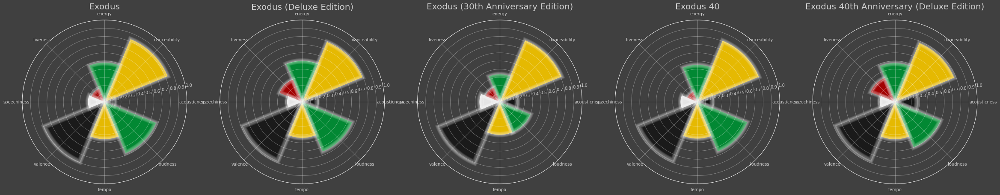

In [369]:
data = version_df_avgs[['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo_scaled', 'loudness_scaled']]


theta = np.arange(0,(2 * np.pi) , ((2 * np.pi)/8))
width = np.pi /4

colors = [  
           
    '#1a1a1a',  # black
     '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]


fig = plt.figure(figsize=(40, 30))


ax1 = fig.add_subplot(151, polar=True)

radii =  data.iloc[0]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax1.grid(alpha=0.4)    
ax1.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=10)    
ax1.set_rlabel_position(10)
ax1.set_rticks(np.arange(0,1.1, 0.1))
ax1.set_title('Exodus', fontsize = 20)



ax2 = fig.add_subplot(152, polar=True)

radii =  data.iloc[1]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax2.grid(alpha=0.4)    
ax2.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=10)    
ax2.set_rlabel_position(10)
ax2.set_rticks(np.arange(0,1.1, 0.1))
ax2.set_title('Exodus (Deluxe Edition)', fontsize = 20)



ax3 = fig.add_subplot(153, polar=True)

radii =  data.iloc[2]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax3.grid(alpha=0.4)    
ax3.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=10)    
ax3.set_rlabel_position(10)
ax3.set_rticks(np.arange(0,1.1, 0.1))
ax3.set_title('Exodus (30th Anniversary Edition)', fontsize = 20)




ax4 = fig.add_subplot(154, polar=True)

radii =  data.iloc[3]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax4.grid(alpha=0.4)    
ax4.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=10)    
ax4.set_rlabel_position(10)
ax4.set_rticks(np.arange(0,1.1, 0.1))
ax4.set_title('Exodus 40', fontsize = 20)



ax5 = fig.add_subplot(155, polar=True)

radii =  data.iloc[4]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax5.grid(alpha=0.4)    
ax5.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=10)    
ax5.set_rlabel_position(10)
ax5.set_rticks(np.arange(0,1.1, 0.1))
ax5.set_title('Exodus 40th Anniversary (Deluxe Edition)', fontsize = 20)


plt.show()

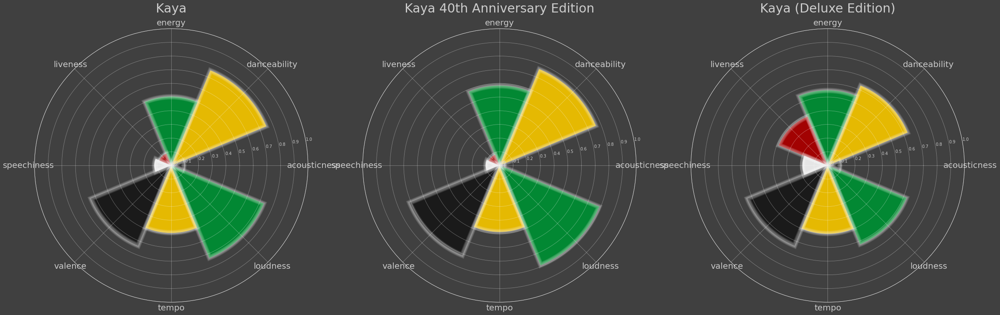

In [370]:
data = version_df_avgs[['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo_scaled', 'loudness_scaled']]


theta = np.arange(0,(2 * np.pi) , ((2 * np.pi)/8))
width = np.pi /4

colors = [  
           
    '#1a1a1a',  # black
     '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]


fig = plt.figure(figsize=(40, 30))


ax1 = fig.add_subplot(131, polar=True)

radii =  data.iloc[5]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax1.grid(alpha=0.4)    
ax1.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=20)    
ax1.set_rlabel_position(10)
ax1.set_rticks(np.arange(0,1.1, 0.1))
ax1.set_title('Kaya', fontsize = 30)



ax2 = fig.add_subplot(132, polar=True)

radii =  data.iloc[6]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax2.grid(alpha=0.4)    
ax2.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=20)    
ax2.set_rlabel_position(10)
ax2.set_rticks(np.arange(0,1.1, 0.1))
ax2.set_title('Kaya 40th Anniversary Edition', fontsize = 30)



ax3 = fig.add_subplot(133, polar=True)

radii =  data.iloc[7]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax3.grid(alpha=0.4)    
ax3.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=20)    
ax3.set_rlabel_position(10)
ax3.set_rticks(np.arange(0,1.1, 0.1))
ax3.set_title('Kaya (Deluxe Edition)', fontsize = 30)




plt.show()

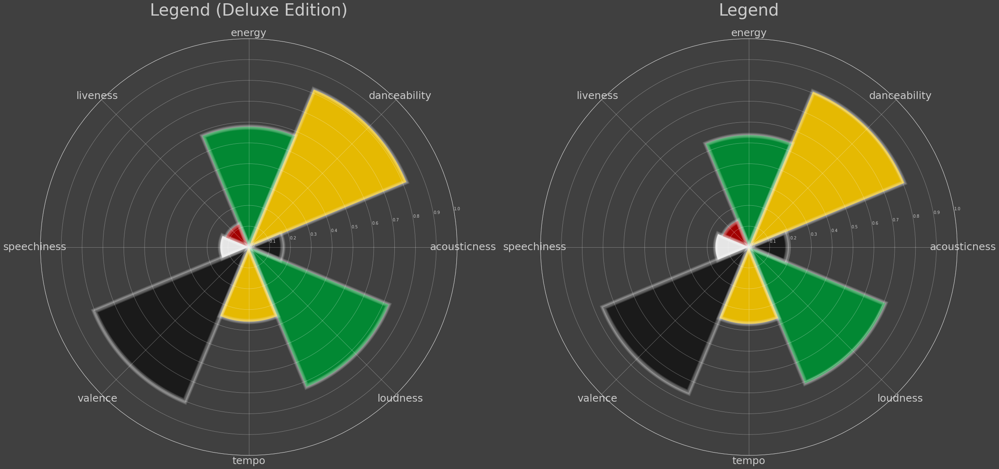

In [371]:
data = version_df_avgs[['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo_scaled', 'loudness_scaled']]


theta = np.arange(0,(2 * np.pi) , ((2 * np.pi)/8))
width = np.pi /4

colors = [  
           
    '#1a1a1a',  # black
     '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]


fig = plt.figure(figsize=(40, 30))


ax1 = fig.add_subplot(121, polar=True)

radii =  data.iloc[8]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax1.grid(alpha=0.4)    
ax1.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=25)    
ax1.set_rlabel_position(10)
ax1.set_rticks(np.arange(0,1.1, 0.1))
ax1.set_title('Legend (Deluxe Edition)', fontsize = 40)



ax2 = fig.add_subplot(122, polar=True)

radii =  data.iloc[9]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax2.grid(alpha=0.4)    
ax2.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=25)    
ax2.set_rlabel_position(10)
ax2.set_rticks(np.arange(0,1.1, 0.1))
ax2.set_title('Legend', fontsize = 40)


plt.show()



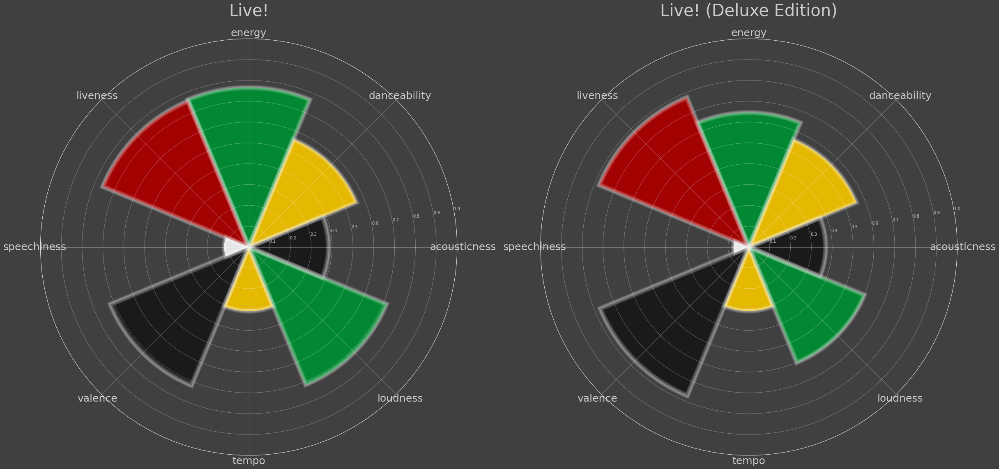

In [372]:
data = version_df_avgs[['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo_scaled', 'loudness_scaled']]


theta = np.arange(0,(2 * np.pi) , ((2 * np.pi)/8))
width = np.pi /4

colors = [  
           
    '#1a1a1a',  # black
     '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]


fig = plt.figure(figsize=(40, 30))


ax1 = fig.add_subplot(121, polar=True)

radii =  data.iloc[10]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax1.grid(alpha=0.4)    
ax1.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=25)    
ax1.set_rlabel_position(10)
ax1.set_rticks(np.arange(0,1.1, 0.1))
ax1.set_title('Live!', fontsize = 40)



ax2 = fig.add_subplot(122, polar=True)

radii =  data.iloc[11]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax2.grid(alpha=0.4)    
ax2.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=25)    
ax2.set_rlabel_position(10)
ax2.set_rticks(np.arange(0,1.1, 0.1))
ax2.set_title('Live! (Deluxe Edition)', fontsize = 40)


plt.show()




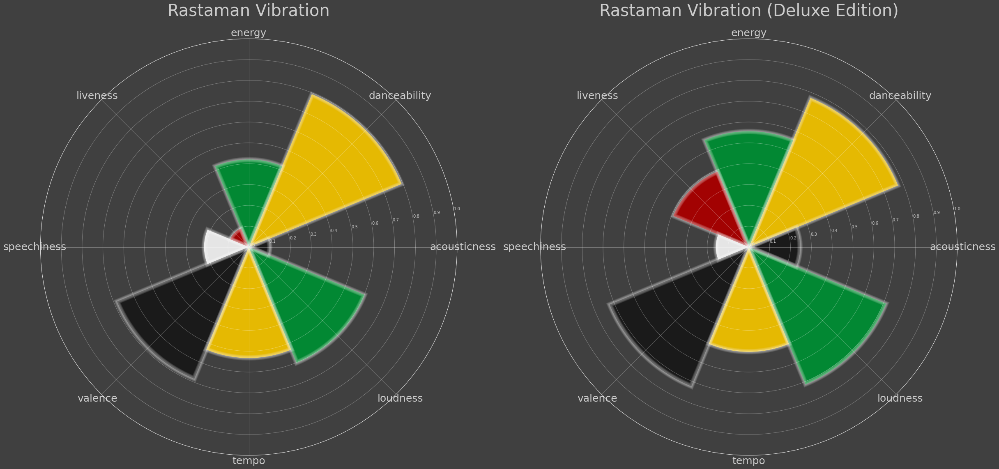

In [373]:
data = version_df_avgs[['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo_scaled', 'loudness_scaled']]


theta = np.arange(0,(2 * np.pi) , ((2 * np.pi)/8))
width = np.pi /4

colors = [  
           
    '#1a1a1a',  # black
     '#ffcc00',  # yellow 
    '#009933',  # green      
    '#b30000',  # red
    '#ffffff',  # white 
]


fig = plt.figure(figsize=(40, 30))


ax1 = fig.add_subplot(121, polar=True)

radii =  data.iloc[12]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax1.grid(alpha=0.4)    
ax1.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=25)    
ax1.set_rlabel_position(10)
ax1.set_rticks(np.arange(0,1.1, 0.1))
ax1.set_title('Rastaman Vibration', fontsize = 40)



ax2 = fig.add_subplot(122, polar=True)

radii =  data.iloc[13]

plt.bar(theta, radii, width=width, bottom=0.0, color=colors, alpha=0.8, edgecolor=colors)

n_shades = 10
diff_linewidth = 1.2
alpha_value = 0.6/ n_shades

for n in range(1, n_shades+1):
    plt.bar(theta, radii, width=width, bottom=0.0, color=colors, edgecolor='white', 
        linewidth=2+(diff_linewidth*n),
        alpha=alpha_value)

ax2.grid(alpha=0.4)    
ax2.set_xticklabels(['acousticness', 'danceability', 'energy', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness'], fontsize=25)    
ax2.set_rlabel_position(10)
ax2.set_rticks(np.arange(0,1.1, 0.1))
ax2.set_title('Rastaman Vibration (Deluxe Edition)', fontsize = 40)


plt.show()



